In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
import random
from sklearn.metrics import mean_absolute_error
from statistics import mean

### Directory List

In [3]:
input_file_dir = "../dataset/nonfin_2020_2023_striped.csv"
model_input_dir = "../models/model_LSTM_PT_cabang_237/"
prediction_output_dir = "../predictions/PT_new/" # append file name
forecast_output_dir = "../forecast/PT_new/"

In [4]:
df = pd.read_csv(input_file_dir, delimiter="|", header=0, dtype=str)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15319761 entries, 0 to 15319760
Data columns (total 12 columns):
 #   Column             Dtype 
---  ------             ----- 
 0   dt                 object
 1   trans_type_key     object
 2   trans_lng_nm       object
 3   branch_key         object
 4   sumtrx             object
 5   branch_address1    object
 6   branch_address2    object
 7   region_key         object
 8   jabo_nonjabotabek  object
 9   city_key           object
 10  geography          object
 11  flag_big_city      object
dtypes: object(12)
memory usage: 1.4+ GB


In [6]:
df.head()

,dt,trans_type_key,trans_lng_nm,branch_key,sumtrx,branch_address1,branch_address2,region_key,jabo_nonjabotabek,city_key,geography,flag_big_city
0,2020-10-20,435,Pemesanan Warkat,838,3,SENTRA NIAGA HARAPAN INDAH KAV. CP2 NO.1 KOTA ...,17214,9,J,24,JAKARTA,B
1,2021-04-19,727,Cetak Mutasi Harian,259,2,JL. MUWARDI 1/44,11450,10,J,24,NaN,B
2,2021-05-03,482,Buka Blokir Kartu,1074,2,"KOMP. PERUM TAMAN PALEM LESTARI C5 NO. 9 -11, ...",11730,12,J,24,NaN,B
3,2021-03-08,383,Registrasi m-BCA,196,22,JL. TRUNOJOYO 145,68137,7,N,20,NaN,K
4,2021-11-09,436,Penawaran Solusi,1336,1,"JL. RADEN SALEH NO. 39B, KEL. KARANG MULYA, KE...",15157,12,J,24,NaN,B


In [7]:
# row_filter = df["trans_lng_nm"] == "Pemrek Tahapan/Tabunganku"
col_filter = ["dt", "trans_type_key", "trans_lng_nm", "branch_key", "sumtrx"]
df = df.loc[:, col_filter]

In [8]:
df.head()

,dt,trans_type_key,trans_lng_nm,branch_key,sumtrx
0,2020-10-20,435,Pemesanan Warkat,838,3
1,2021-04-19,727,Cetak Mutasi Harian,259,2
2,2021-05-03,482,Buka Blokir Kartu,1074,2
3,2021-03-08,383,Registrasi m-BCA,196,22
4,2021-11-09,436,Penawaran Solusi,1336,1


In [9]:
df["dt"]                 = pd.to_datetime(df["dt"])
df["trans_lng_nm"]       = df["trans_lng_nm"].astype(str)
df["branch_key"]         = df["branch_key"].astype(np.int32)
df["sumtrx"]             = df["sumtrx"].astype(np.int32)

In [10]:
df

,dt,trans_type_key,trans_lng_nm,branch_key,sumtrx
0,2020-10-20,435,Pemesanan Warkat,838,3
1,2021-04-19,727,Cetak Mutasi Harian,259,2
2,2021-05-03,482,Buka Blokir Kartu,1074,2
3,2021-03-08,383,Registrasi m-BCA,196,22
4,2021-11-09,436,Penawaran Solusi,1336,1
...,...,...,...,...,...
15319756,2022-03-16,457,Turek Tabungan Berjangka SBJT,164,1
15319757,2022-05-27,457,Turek Tabungan Berjangka SBJT,1017,1
15319758,2022-04-28,457,Turek Tabungan Berjangka SBJT,1087,1
15319759,2022-08-30,457,Turek Tabungan Berjangka SBJT,217,1


In [11]:
# df = df.sort_values(by=["dt"], ascending=True).set_index("dt")

In [12]:
df

,dt,trans_type_key,trans_lng_nm,branch_key,sumtrx
0,2020-10-20,435,Pemesanan Warkat,838,3
1,2021-04-19,727,Cetak Mutasi Harian,259,2
2,2021-05-03,482,Buka Blokir Kartu,1074,2
3,2021-03-08,383,Registrasi m-BCA,196,22
4,2021-11-09,436,Penawaran Solusi,1336,1
...,...,...,...,...,...
15319756,2022-03-16,457,Turek Tabungan Berjangka SBJT,164,1
15319757,2022-05-27,457,Turek Tabungan Berjangka SBJT,1017,1
15319758,2022-04-28,457,Turek Tabungan Berjangka SBJT,1087,1
15319759,2022-08-30,457,Turek Tabungan Berjangka SBJT,217,1


In [13]:
top_branches_key = [137, 145, 64, 164, 17, 237, 274, 404, 37, 45]

In [14]:
# row_filter = (df["branch_key"] == 137) & (df["dt"] >= "2020-01-02") & (df["dt"] <= "2023-06-16")
# col_filter = ["dt", "sumtrx"]
# df.loc[row_filter, col_filter].groupby("dt") \
#                .agg({"sumtrx": "sum"}) \
#                .sort_values(by=["dt"], ascending=True) \
#                .asfreq('D', fill_value=0)

In [15]:
# Membuat fungsi untuk mengubah data menjadi bentuk yang sesuai untuk LSTM
def create_dataset(data, time_steps):
    X, Y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:(i + time_steps), 0])
        Y.append(data[i + time_steps, 0])
    return np.array(X), np.array(Y)

In [16]:
def calc_mae(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    return mae

In [17]:
def calc_smape(actual, predicted):
    numerator = np.abs(actual - predicted)
    denominator = (np.abs(actual) + np.abs(predicted)) / 2
    smape_score = np.mean(numerator / denominator) * 100
    return smape_score

In [18]:
def set_data(df, transaction_name, branch_key): 
    filter_column = (df['trans_lng_nm'] == transaction_name) & (df['branch_key'] == branch_key)
    res = df[filter_column]
    res = res.groupby(['trans_lng_nm', 'dt']).agg({'sumtrx':'sum'})
    res.reset_index(level=0, drop=True, inplace=True)
    
    return res

In [19]:
def set_testset(df, date_start, date_end):
    res = df.loc[date_start:date_end]
    return res

In [20]:
def fill_datetime(df, date_start, date_end):
    # Membuat rentang tanggal yang diinginkan
    date_range = pd.date_range(start=date_start, end=date_end, freq='D')

    # Mengisi dataframe dengan rentang tanggal yang lengkap
    res = df.reindex(date_range, fill_value=0)

    # Return dataframe yang telah diisi dengan nilai nol pada tanggal yang hilang
    return res

40/40 [==============================] - 2s 4ms/step
            Actual  Predicted
2020-01-09      27  27.175453
2020-01-10      27  24.792515
2020-01-11       0  -0.246902
2020-01-12       0  -0.357652
2020-01-13      43  47.564068
...            ...        ...
2023-06-14      33  37.475185
2023-06-15      27  23.915630
2023-06-16      28  28.258802
2023-06-17      18  14.780263
2023-06-18      10  14.254782

[1257 rows x 2 columns]


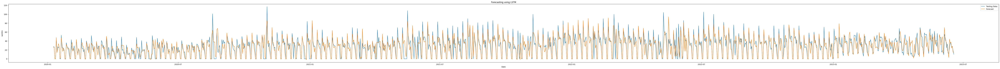

40/40 [==============================] - 1s 4ms/step
            Actual  Predicted
2020-01-09      16   6.138181
2020-01-10      13  13.656788
2020-01-11       0   1.161127
2020-01-12       0  -0.362310
2020-01-13      24  36.290806
...            ...        ...
2023-06-14      30  43.696438
2023-06-15      44  22.493170
2023-06-16      24  32.753761
2023-06-17      12  17.495981
2023-06-18       8  39.357155

[1257 rows x 2 columns]


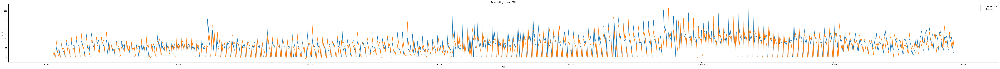

40/40 [==============================] - 1s 4ms/step
            Actual  Predicted
2020-01-09      27  22.585377
2020-01-10      18  28.583519
2020-01-11       0   0.208028
2020-01-12       0   1.430477
2020-01-13      30  48.380920
...            ...        ...
2023-06-14      18  17.584782
2023-06-15      33  29.252560
2023-06-16       7  32.661438
2023-06-17       2   5.409615
2023-06-18       3  39.164360

[1257 rows x 2 columns]


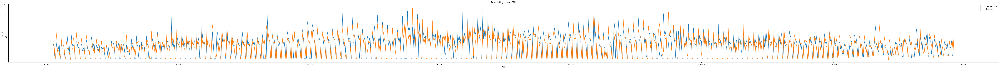

40/40 [==============================] - 2s 4ms/step
            Actual  Predicted
2020-01-09      18  18.570570
2020-01-10      18  23.375263
2020-01-11       0  -0.322644
2020-01-12       0  -0.388732
2020-01-13      27  42.283363
...            ...        ...
2023-06-14      32  31.101141
2023-06-15      40  36.794109
2023-06-16      24  35.555752
2023-06-17      19   6.758371
2023-06-18       7  25.565359

[1257 rows x 2 columns]


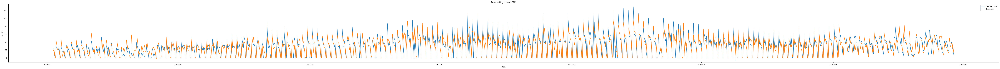

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      15  11.726031
2020-01-10      22   5.751206
2020-01-11       0   1.654576
2020-01-12       0   4.772627
2020-01-13      38  66.605515
...            ...        ...
2023-06-14      22  52.057457
2023-06-15      21  34.765621
2023-06-16      24   9.823061
2023-06-17      10  12.104758
2023-06-18       3   9.010757

[1257 rows x 2 columns]


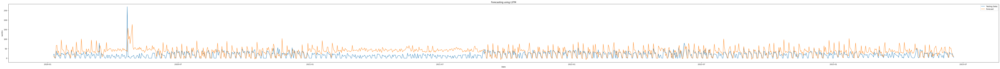

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      23  23.168371
2020-01-10      27  26.982641
2020-01-11       0  -0.059741
2020-01-12       0  -0.186835
2020-01-13      38  37.403393
...            ...        ...
2023-06-14      48  47.788971
2023-06-15      44  43.675407
2023-06-16      44  44.201363
2023-06-17      16  15.851361
2023-06-18       9   8.652735

[1257 rows x 2 columns]


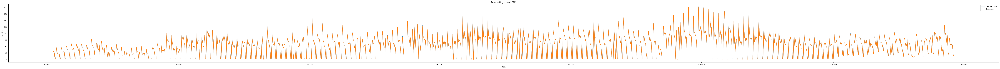

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      23  22.308151
2020-01-10      24  24.347254
2020-01-11       0  -0.083485
2020-01-12       0   0.304270
2020-01-13      37  49.086742
...            ...        ...
2023-06-14      24  26.189432
2023-06-15      25  24.212894
2023-06-16      32  39.421185
2023-06-17       9   6.110012
2023-06-18       9   2.131174

[1257 rows x 2 columns]


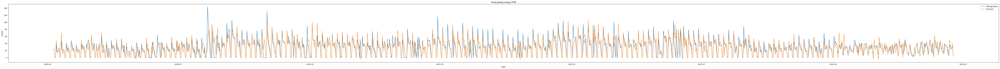

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      18  33.887623
2020-01-10      26  20.949438
2020-01-11       0   0.065200
2020-01-12       0   0.061618
2020-01-13      47  51.566479
...            ...        ...
2023-06-14      28  52.463207
2023-06-15      26  51.176292
2023-06-16      22  30.408897
2023-06-17      17  40.374264
2023-06-18       7  61.007950

[1257 rows x 2 columns]


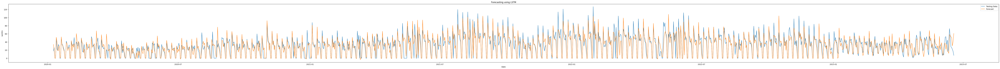

40/40 [==============================] - 1s 5ms/step
            Actual  Predicted
2020-01-09      19  16.407938
2020-01-10      19  23.759169
2020-01-11       0   1.468032
2020-01-12       0  -0.763090
2020-01-13      26  39.500572
...            ...        ...
2023-06-14      24  15.507895
2023-06-15      26  14.976553
2023-06-16      21  43.038818
2023-06-17       8   8.711007
2023-06-18       5  12.164601

[1257 rows x 2 columns]


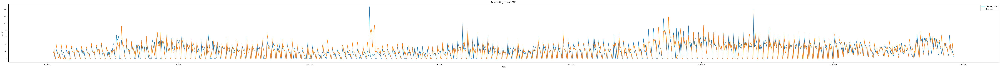

40/40 [==============================] - 1s 4ms/step
            Actual  Predicted
2020-01-09      27  19.232491
2020-01-10      17  24.547331
2020-01-11       0   0.298606
2020-01-12       0   4.193827
2020-01-13      27  30.339993
...            ...        ...
2023-06-14      20  23.431547
2023-06-15      13  24.869877
2023-06-16      14  12.546860
2023-06-17       2   6.093095
2023-06-18       6   0.095577

[1257 rows x 2 columns]


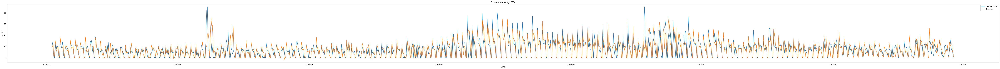

In [21]:
MAE_for_branch = {}
SMAPE_for_branch = {}
for branch_key in top_branches_key:
    date_start = "2020-01-02"
    date_end   = "2023-06-18"
    actual = set_data(df, "Pemrek Tahapan/Tabunganku", branch_key)
    actual = set_testset(actual, date_start, date_end)
    actual = fill_datetime(actual, date_start, date_end)
    time_steps = 7

    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_res = scaler.fit_transform(actual.values.reshape(-1, 1))
    
    x__test, y__test = create_dataset(scaled_res, time_steps)
    x__test = np.reshape(x__test, (x__test.shape[0], x__test.shape[1], 1))
    model = tf.keras.models.load_model(model_input_dir)

    predicted = model.predict(x__test)
    predicted = scaler.inverse_transform(predicted)

    # Menampilkan hasil prediksi
    predicted_data = pd.DataFrame(predicted, columns=['Predicted'], index=actual[time_steps:].index)
    actual_data = pd.DataFrame(actual[time_steps:].values, columns=['Actual'], index=actual[time_steps:].index)
    actual_vs_predicted = pd.concat([actual_data, predicted_data], axis=1)
    print(actual_vs_predicted)

    MAE_for_branch[branch_key] = calc_mae(actual_vs_predicted["Actual"], actual_vs_predicted["Predicted"])
    SMAPE_for_branch[branch_key] = calc_smape(actual_vs_predicted["Actual"], actual_vs_predicted["Predicted"])

    plt.figure(figsize=(100, 6))
    plt.plot(actual_vs_predicted.index, actual_vs_predicted["Actual"], label='Testing Data')
    plt.plot(actual_vs_predicted.index, actual_vs_predicted["Predicted"], label='Forecast')
    plt.xlabel('Date')
    plt.ylabel('sumtrx')
    plt.title('Forecasting using LSTM')
    plt.legend()
    plt.show()

    # Save the data as a CSV file 
    ###################### Ganti csv_{i} ke contoh xpresi{i}/ gantikartu_{i} #######################
    # csv_filename = f"Pemrek_Tahapan_Tabunganku_{branch_key}.csv"
    # actual_vs_predicted.to_csv(f"{prediction_output_dir}{csv_filename}", index=True)
    # print(f"CSV file {csv_filename} saved.")
    
    
    

In [22]:
for branch_key in top_branches_key:
    print(f"Branch {branch_key}")
    print(f"MAE = {MAE_for_branch[branch_key]}")
    print(f"SMAPE = {SMAPE_for_branch[branch_key]}\n")

Branch 137
MAE = 8.442930275483935
SMAPE = 77.7205025316197

Branch 145
MAE = 8.486675846323003
SMAPE = 79.66683643972078

Branch 64
MAE = 7.807670421418256
SMAPE = 79.01940979704564

Branch 164
MAE = 9.296020088588424
SMAPE = 78.83782859394435

Branch 17
MAE = 21.22145430974858
SMAPE = 106.59565026717827

Branch 237
MAE = 0.2574596706371793
SMAPE = 56.149750953370294

Branch 274
MAE = 9.521009540406123
SMAPE = 80.52043303862997

Branch 404
MAE = 9.075157551179354
SMAPE = 77.92657747876275

Branch 37
MAE = 9.2643328686982
SMAPE = 84.53750546961066

Branch 45
MAE = 6.5762689899099
SMAPE = 88.48063507226101



1/1 [==============================] - 0s 30ms/step


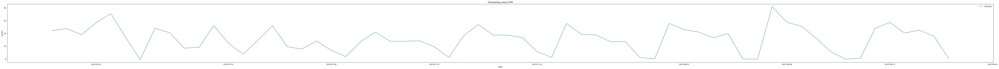

CSV file Pemrek_Tahunan_Tabunganku_137.csv saved.
1/1 [==============================] - 0s 26ms/step


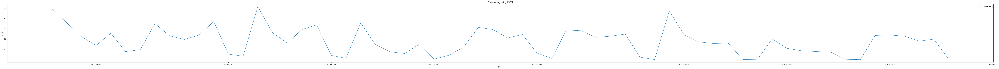

CSV file Pemrek_Tahunan_Tabunganku_145.csv saved.
1/1 [==============================] - 0s 33ms/step


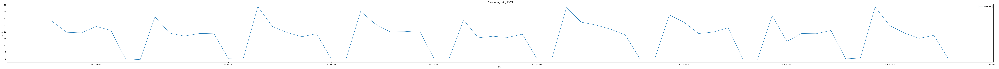

CSV file Pemrek_Tahunan_Tabunganku_64.csv saved.
1/1 [==============================] - 0s 30ms/step


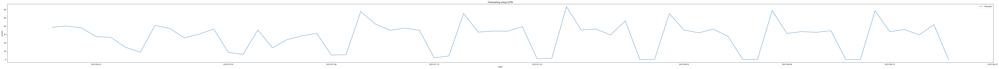

CSV file Pemrek_Tahunan_Tabunganku_164.csv saved.
1/1 [==============================] - 0s 24ms/step


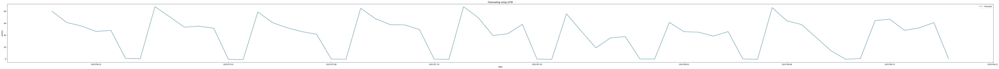

CSV file Pemrek_Tahunan_Tabunganku_17.csv saved.
1/1 [==============================] - 0s 28ms/step


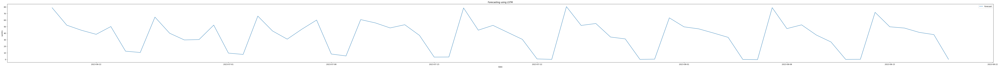

CSV file Pemrek_Tahunan_Tabunganku_237.csv saved.
1/1 [==============================] - 0s 37ms/step


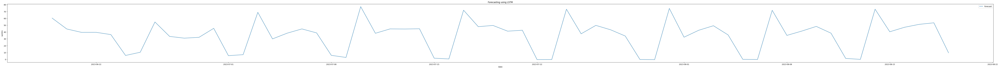

CSV file Pemrek_Tahunan_Tabunganku_274.csv saved.
1/1 [==============================] - 0s 26ms/step


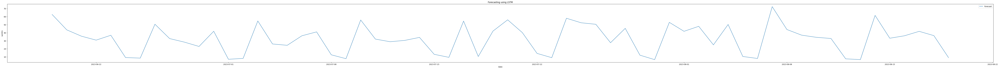

CSV file Pemrek_Tahunan_Tabunganku_404.csv saved.
1/1 [==============================] - 0s 36ms/step


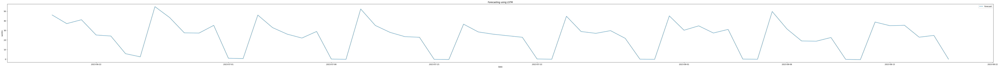

CSV file Pemrek_Tahunan_Tabunganku_37.csv saved.
1/1 [==============================] - 0s 29ms/step


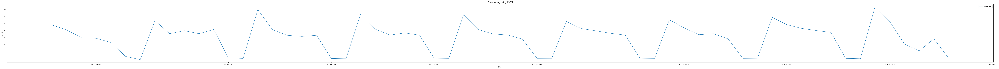

CSV file Pemrek_Tahunan_Tabunganku_45.csv saved.


In [49]:
MAE_for_branch = {}
SMAPE_for_branch = {}
for branch_key in top_branches_key:
    date_start = "2020-01-02"
    date_end   = "2023-06-18"
    actual = set_data(df, "Pemrek Tahapan/Tabunganku", branch_key)
    actual = set_testset(actual, date_start, date_end)
    actual = fill_datetime(actual, date_start, date_end)
    time_steps = 7

    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_res = scaler.fit_transform(actual.values)

    # DATA EXTEND PREDICT PREPARATION
    date_start_predict = "2023-06-19"
    date_end_predict = "2023-08-19"

    # Buat rentang tanggal yang diinginkan
    date_range = pd.date_range(start=date_start_predict, end=date_end_predict, freq='D')

    # Buat array kosong untuk menampung input prediksi
    x__test = np.zeros((len(date_range) + time_steps, 1))

    # Isi array x__test dengan nilai awal yang sesuai
    initial_data = scaled_res[-time_steps:, 0]
    x__test[:time_steps, 0] = initial_data
    
    model = tf.keras.models.load_model(model_input_dir)

    # Melakukan prediksi
    for step in range(len(date_range)):
        input_data = np.reshape(x__test[step:step+time_steps, 0], (1, time_steps, 1))
        forecast = model.predict(input_data)
        x__test[step+time_steps, 0] = forecast

    forecast = scaler.inverse_transform(x__test[time_steps:, 0].reshape(-1, 1))
    
    forecast_result = pd.DataFrame(index=date_range).rename_axis("dt")
    forecast_result["Predicted"] = forecast

    plt.figure(figsize=(100, 6))
    plt.plot(forecast_result.index, forecast_result["Predicted"], label="Forecast")
    plt.xlabel('Date')
    plt.ylabel('sumtrx')
    plt.title('Forecasting using LSTM')
    plt.legend()
    plt.show()

    # Save the data as a CSV file 
    ###################### Ganti csv_{i} ke contoh xpresi{i}/ gantikartu_{i} #######################
    csv_filename = f"Pemrek_Tahunan_Tabunganku_{branch_key}.csv"
    forecast_result.to_csv(f"{forecast_output_dir}{csv_filename}", index=True)
    print(f"CSV file {csv_filename} saved.")
    
    
    